In [1]:
import torch
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

import numpy as np
import pandas as pd
import torch.nn as nn
import torch.nn.functional as F

import cv2

# Remove all the warnings
import warnings
warnings.filterwarnings('ignore')

# Set env CUDA_LAUNCH_BLOCKING=1
import os
os.environ['CUDA_LAUNCH_BLOCKING'] = '1'
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

import random

# Retina display
%config InlineBackend.figure_format = 'retina'

try :
  from einops import rearrange
except ModuleNotFoundError :
  %pip install einops
  from einops import rearrange

In [2]:
if os.path.exists('dog.jpg'):
    print('dog.jpg exists')
else:
    !wget https://segment-anything.com/assets/gallery/AdobeStock_94274587_welsh_corgi_pembroke_CD.jpg -O dog.jpg

dog.jpg exists


In [3]:
# Read in a image from torchvision
img = torchvision.io.read_image("dog.jpg")
print(img.shape)

torch.Size([3, 1365, 2048])


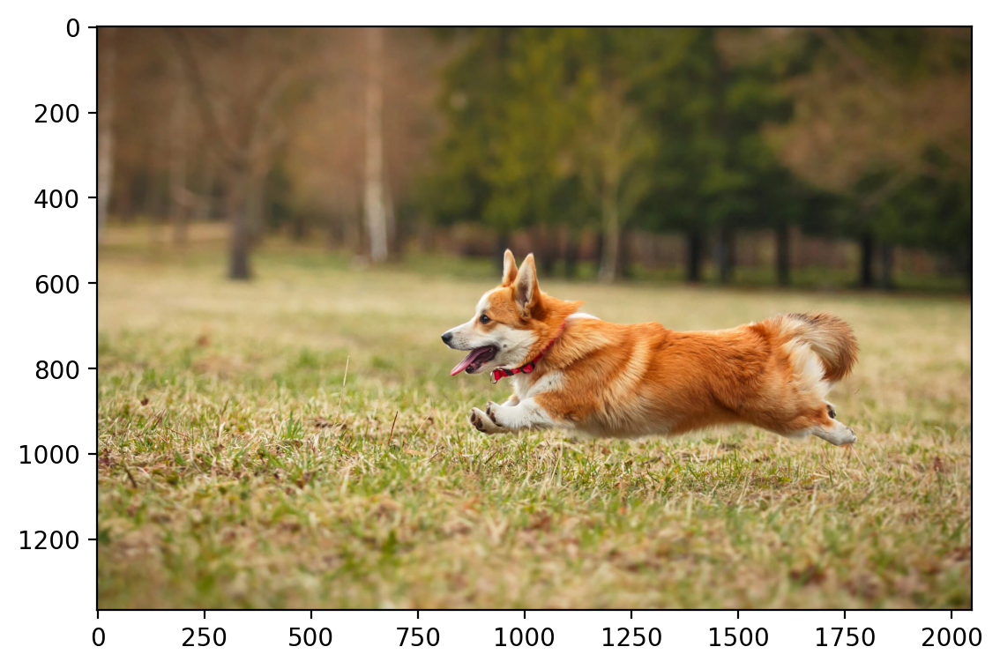

In [4]:
plt.imshow(rearrange(img, 'c h w -> h w c').numpy())

In [5]:
from sklearn import preprocessing

scaler_img = preprocessing.MinMaxScaler().fit(img.reshape(-1, 1))
scaler_img

MinMaxScaler()

In [6]:
img_scaled = scaler_img.transform(img.reshape(-1, 1)).reshape(img.shape)

img_scaled = torch.tensor(img_scaled)
img_scaled

tensor([[[0.3098, 0.3137, 0.3137,  ..., 0.2941, 0.2941, 0.2980],
         [0.3098, 0.3137, 0.3137,  ..., 0.2941, 0.2941, 0.2980],
         [0.3098, 0.3137, 0.3137,  ..., 0.2941, 0.2941, 0.2980],
         ...,
         [0.4745, 0.4745, 0.4784,  ..., 0.3804, 0.3765, 0.3765],
         [0.4745, 0.4745, 0.4784,  ..., 0.3804, 0.3804, 0.3765],
         [0.4745, 0.4745, 0.4784,  ..., 0.3843, 0.3804, 0.3804]],

        [[0.2039, 0.2078, 0.2078,  ..., 0.2157, 0.2157, 0.2118],
         [0.2039, 0.2078, 0.2078,  ..., 0.2157, 0.2157, 0.2118],
         [0.2039, 0.2078, 0.2078,  ..., 0.2157, 0.2157, 0.2118],
         ...,
         [0.4039, 0.4039, 0.4078,  ..., 0.3216, 0.3176, 0.3176],
         [0.4039, 0.4039, 0.4078,  ..., 0.3216, 0.3216, 0.3176],
         [0.4039, 0.4039, 0.4078,  ..., 0.3255, 0.3216, 0.3216]],

        [[0.1373, 0.1412, 0.1412,  ..., 0.1176, 0.1176, 0.1176],
         [0.1373, 0.1412, 0.1412,  ..., 0.1176, 0.1176, 0.1176],
         [0.1373, 0.1412, 0.1412,  ..., 0.1176, 0.1176, 0.

In [7]:
img_scaled = img_scaled.to(device)
img_scaled.shape

torch.Size([3, 1365, 2048])

In [8]:
crop = torchvision.transforms.functional.crop(img_scaled.cpu(), 600, 800, 300, 300)
crop.shape

torch.Size([3, 300, 300])

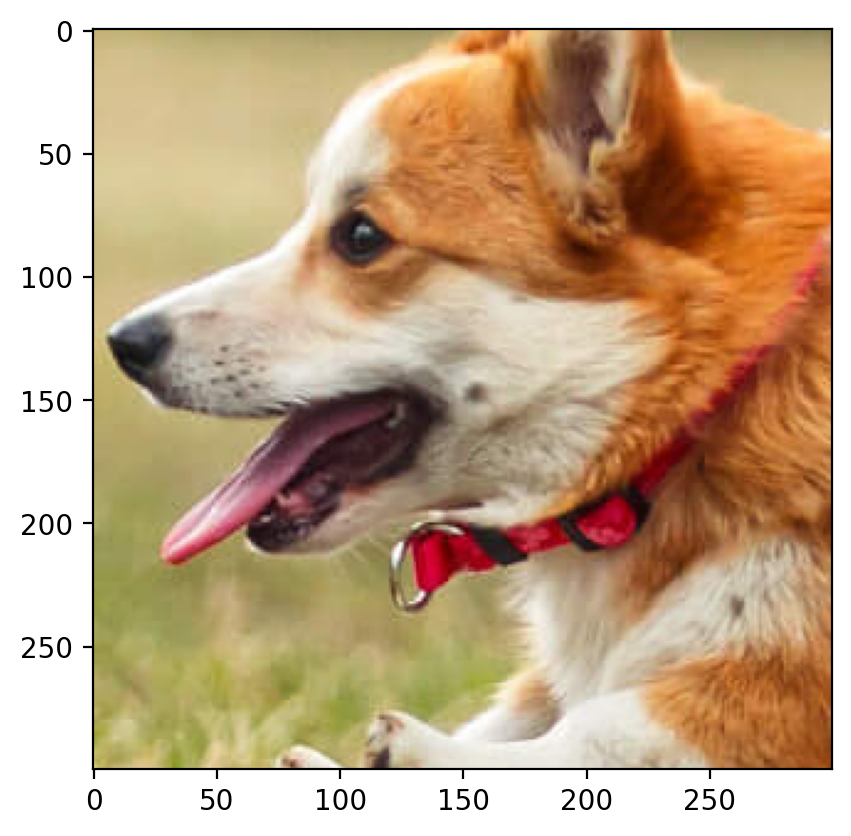

In [9]:
plt.imshow(rearrange(crop, 'c h w -> h w c').cpu().numpy())

In [10]:
crop = crop.to(device)

In [11]:
# Get the dimensions of the image tensor
num_channels, height, width = crop.shape
print(num_channels, height, width)

3 300 300


In [12]:
def create_coordinate_map(img, scale=1):
    """
    img: torch.Tensor of shape (num_channels, height, width)

    return: tuple of torch.Tensor of shape (height * width, 2) and torch.Tensor of shape (height * width, num_channels)
    """

    num_channels, height, width = img.shape

    # Create a 2D grid of (x,y) coordinates (h, w)
    # width values change faster than height values
    w_coords = torch.arange(0, width,  1/scale).repeat(int(height*scale), 1)
    h_coords = torch.arange(0, height, 1/scale).repeat(int(width*scale), 1).t()
    w_coords = w_coords.reshape(-1)
    h_coords = h_coords.reshape(-1)

    # Combine the x and y coordinates into a single tensor
    X = torch.stack([h_coords, w_coords], dim=1).float()

    # Move X to GPU if available
    X = X.to(device)

    # Reshape the image to (h * w, num_channels)
    Y = rearrange(img, 'c h w -> (h w) c').float()

    # Move X to GPU if available
    Y = Y.to(device)

    return X, Y

In [13]:
dog_X, dog_Y = create_coordinate_map(crop, scale=1)

dog_X.shape, dog_Y.shape

(torch.Size([90000, 2]), torch.Size([90000, 3]))

In [14]:
# MinMaxScaler from -1 to 1
scaler_X = preprocessing.MinMaxScaler(feature_range=(-1, 1)).fit(dog_X.cpu())

# Scale the X coordinates
dog_X_scaled = scaler_X.transform(dog_X.cpu())

# Move the scaled X coordinates to the GPU
dog_X_scaled = torch.tensor(dog_X_scaled).to(device)

# Set to dtype float32
dog_X_scaled = dog_X_scaled.float()

In [15]:
# create RFF features
def create_rff_features(X, num_features, sigma):
    from sklearn.kernel_approximation import RBFSampler
    rff = RBFSampler(n_components=num_features, gamma=1/(2 * sigma**2))
    X = X.cpu().numpy()
    X = rff.fit_transform(X)
    return torch.tensor(X, dtype=torch.float32).to(device)

In [16]:
X_rff = create_rff_features(dog_X_scaled, 15000, 0.008)

In [17]:
class LinearModel(nn.Module):
    def __init__(self, in_features, out_features):
        super(LinearModel, self).__init__()
        self.linear = nn.Linear(in_features, out_features)

    def forward(self, x):
        return self.linear(x)

In [18]:
def train(net, lr, X, Y, epochs, verbose=True):
    """
    net: torch.nn.Module
    lr: float
    X: torch.Tensor of shape (num_samples, 2)
    Y: torch.Tensor of shape (num_samples, 3)
    """

    criterion = nn.MSELoss()
    optimizer = torch.optim.Adam(net.parameters(), lr=lr)
    for epoch in range(epochs):
        optimizer.zero_grad()
        outputs = net(X)


        loss = criterion(outputs, Y)
        loss.backward()
        optimizer.step()
        if verbose and epoch % 100 == 0:
            print(f"Epoch {epoch} loss: {loss.item():.6f}")
    return loss.item()

In [19]:
def plot_reconstructed_and_original_image(original_img, net, X, title=""):
    """
    net: torch.nn.Module
    X: torch.Tensor of shape (num_samples, 2)
    Y: torch.Tensor of shape (num_samples, 3)
    """
    height, width, num_channels = original_img.shape
    net.eval()
    with torch.no_grad():
        outputs = net(X)
        outputs = outputs.reshape(height, width, num_channels)
        #outputs = outputs.permute(1, 2, 0)
    fig = plt.figure(figsize=(6, 4))
    gs = gridspec.GridSpec(1, 2, width_ratios=[1, 1])

    ax0 = plt.subplot(gs[0])
    ax1 = plt.subplot(gs[1])

    ax0.imshow(outputs.cpu())
    ax0.set_title("Reconstructed Image")


    ax1.imshow(original_img.cpu())
    ax1.set_title("Original Image")

    for a in [ax0, ax1]:
        a.axis("off")


    fig.suptitle(title, y=0.9)
    plt.tight_layout()

In [20]:
loss = np.zeros(9)
psnr = np.zeros(9)

In [21]:
l = dog_Y.shape[0]
a = list(range(0,l))
random.shuffle(a)

In [22]:
y = dog_Y.detach().clone()

# 10% impurity

In [23]:
x = 10
dog_Y[a[(x-10)*l//100:x*l//100]] = torch.tensor([0,0,0], dtype=dog_Y.dtype).to(device)

In [24]:
net = LinearModel(X_rff.shape[1], 3)
net.to(device)

train(net, 0.005, X_rff[a[x*l//100:]], y[a[x*l//100:]], 1500)

with torch.no_grad() :
  out = net(X_rff)

loss[0] = (np.square((y-out).cpu())).sum()/l
psnr[0] = cv2.PSNR(np.array(out.cpu()), np.array(y.cpu()))

Epoch 0 loss: 0.369766
Epoch 100 loss: 0.054511
Epoch 200 loss: 0.016471
Epoch 300 loss: 0.010280
Epoch 400 loss: 0.007339
Epoch 500 loss: 0.005461
Epoch 600 loss: 0.004217
Epoch 700 loss: 0.003375
Epoch 800 loss: 0.002792
Epoch 900 loss: 0.002374
Epoch 1000 loss: 0.002064
Epoch 1100 loss: 0.001825
Epoch 1200 loss: 0.001635
Epoch 1300 loss: 0.001479
Epoch 1400 loss: 0.001350


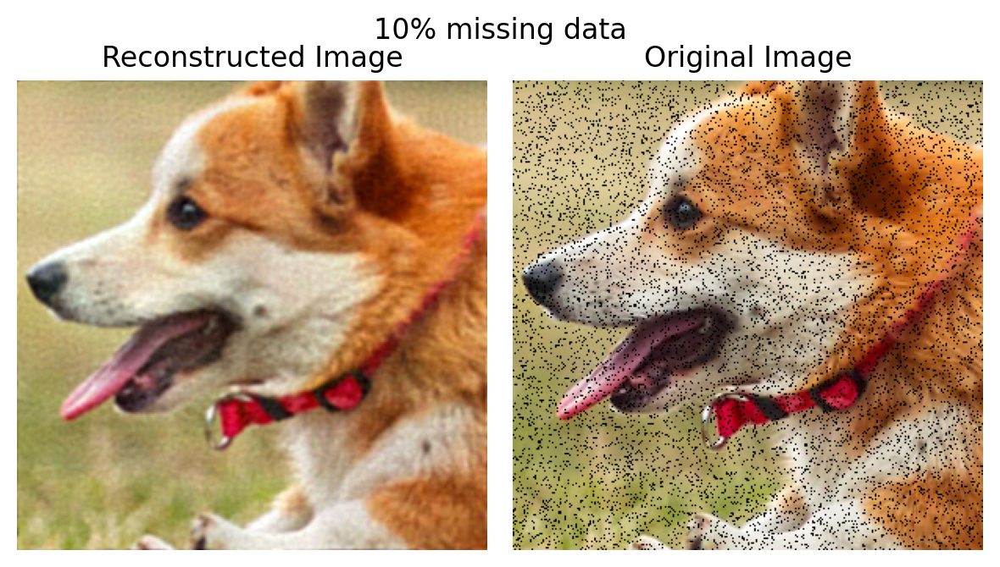

In [25]:
plot_reconstructed_and_original_image(dog_Y.reshape((300,300,3)), net, X_rff, title="10% missing data")

# 20% impurity

In [26]:
del net

x = 20
dog_Y[a[(x-10)*l//100:x*l//100]] = torch.tensor([0,0,0], dtype=dog_Y.dtype).to(device)

In [27]:
net = LinearModel(X_rff.shape[1], 3)
net.to(device)

train(net, 0.005, X_rff[a[x*l//100:]], y[a[x*l//100:]], 1500)

with torch.no_grad() :
  out = net(X_rff)

loss[1] = (np.square((y-out).cpu())).sum()/l
psnr[1] = cv2.PSNR(np.array(out.cpu()), np.array(y.cpu()))

Epoch 0 loss: 0.371759
Epoch 100 loss: 0.054946
Epoch 200 loss: 0.016474
Epoch 300 loss: 0.010142
Epoch 400 loss: 0.007236
Epoch 500 loss: 0.005390
Epoch 600 loss: 0.004164
Epoch 700 loss: 0.003334
Epoch 800 loss: 0.002757
Epoch 900 loss: 0.002343
Epoch 1000 loss: 0.002036
Epoch 1100 loss: 0.001800
Epoch 1200 loss: 0.001612
Epoch 1300 loss: 0.001458
Epoch 1400 loss: 0.001331


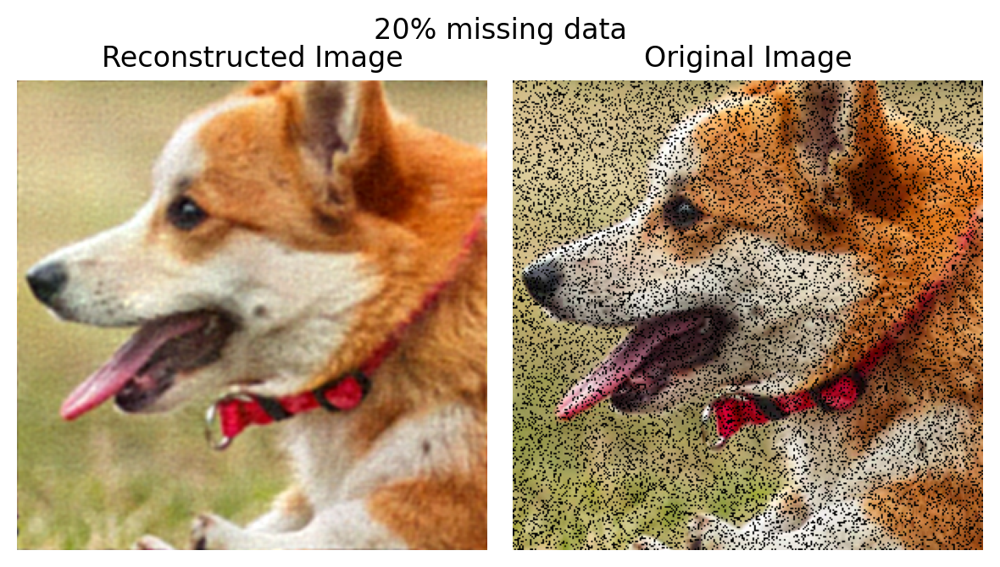

In [28]:
plot_reconstructed_and_original_image(dog_Y.reshape((300,300,3)), net, X_rff, title="20% missing data")

# 30% impurity

In [29]:
del net

x = 30
dog_Y[a[(x-10)*l//100:x*l//100]] = torch.tensor([0,0,0], dtype=dog_Y.dtype).to(device)

In [30]:
net = LinearModel(X_rff.shape[1], 3)
net.to(device)

train(net, 0.005, X_rff[a[x*l//100:]], y[a[x*l//100:]], 1500)

with torch.no_grad() :
  out = net(X_rff)

loss[2] = (np.square((y-out).cpu())).sum()/l
psnr[2] = cv2.PSNR(np.array(out.cpu()), np.array(y.cpu()))

Epoch 0 loss: 0.369486
Epoch 100 loss: 0.053088
Epoch 200 loss: 0.016162
Epoch 300 loss: 0.009965
Epoch 400 loss: 0.007112
Epoch 500 loss: 0.005300
Epoch 600 loss: 0.004097
Epoch 700 loss: 0.003280
Epoch 800 loss: 0.002711
Epoch 900 loss: 0.002304
Epoch 1000 loss: 0.002001
Epoch 1100 loss: 0.001768
Epoch 1200 loss: 0.001584
Epoch 1300 loss: 0.001433
Epoch 1400 loss: 0.001308


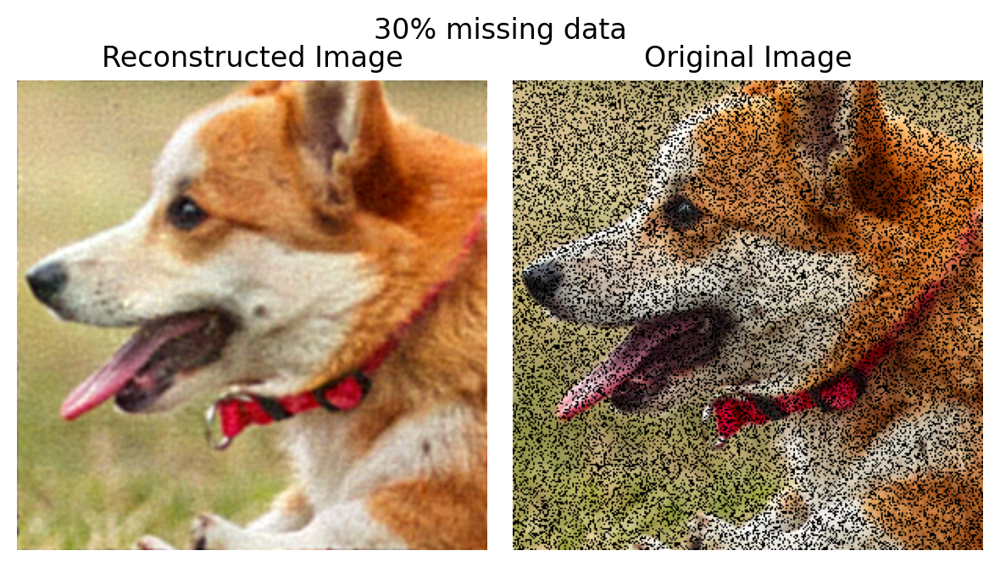

In [31]:
plot_reconstructed_and_original_image(dog_Y.reshape((300,300,3)), net, X_rff, title="30% missing data")

# 40% impurity

In [32]:
del net

x = 40
dog_Y[a[(x-10)*l//100:x*l//100]] = torch.tensor([0,0,0], dtype=dog_Y.dtype).to(device)

In [33]:
net = LinearModel(X_rff.shape[1], 3)
net.to(device)

train(net, 0.005, X_rff[a[x*l//100:]], y[a[x*l//100:]], 1500)

with torch.no_grad() :
  out = net(X_rff)

loss[3] = (np.square((y-out).cpu())).sum()/l
psnr[3] = cv2.PSNR(np.array(out.cpu()), np.array(y.cpu()))

Epoch 0 loss: 0.372074
Epoch 100 loss: 0.052701
Epoch 200 loss: 0.016138
Epoch 300 loss: 0.009758
Epoch 400 loss: 0.006938
Epoch 500 loss: 0.005173
Epoch 600 loss: 0.004003
Epoch 700 loss: 0.003208
Epoch 800 loss: 0.002654
Epoch 900 loss: 0.002256
Epoch 1000 loss: 0.001960
Epoch 1100 loss: 0.001732
Epoch 1200 loss: 0.001551
Epoch 1300 loss: 0.001404
Epoch 1400 loss: 0.001281


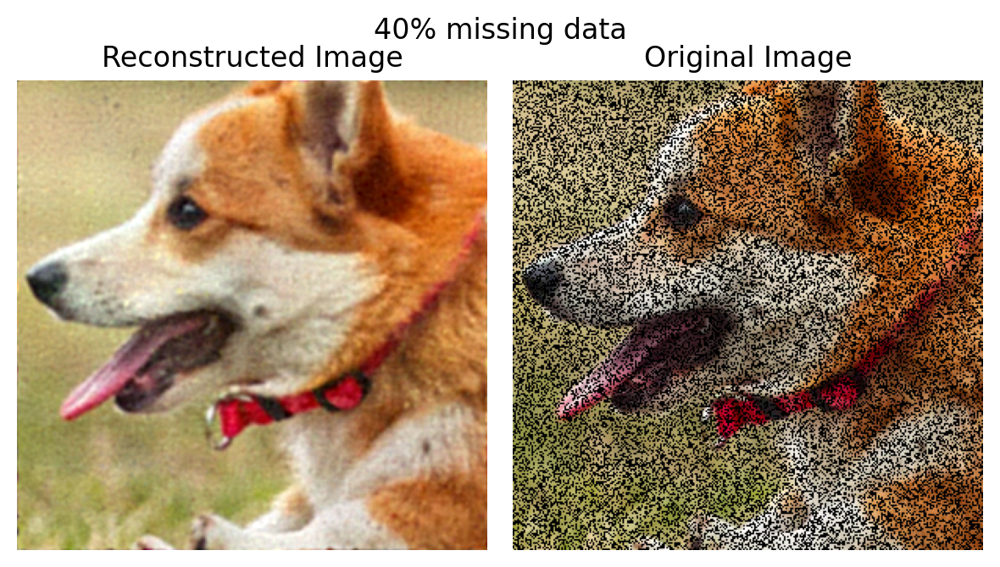

In [34]:
plot_reconstructed_and_original_image(dog_Y.reshape((300,300,3)), net, X_rff, title="40% missing data")

# 50% impurity

In [35]:
del net

x = 50
dog_Y[a[(x-10)*l//100:x*l//100]] = torch.tensor([0,0,0], dtype=dog_Y.dtype).to(device)

In [36]:
net = LinearModel(X_rff.shape[1], 3)
net.to(device)

train(net, 0.005, X_rff[a[x*l//100:]], y[a[x*l//100:]], 1500)

with torch.no_grad() :
  out = net(X_rff)

loss[4] = (np.square((y-out).cpu())).sum()/l
psnr[4] = cv2.PSNR(np.array(out.cpu()), np.array(y.cpu()))

Epoch 0 loss: 0.372168
Epoch 100 loss: 0.051423
Epoch 200 loss: 0.016037
Epoch 300 loss: 0.009480
Epoch 400 loss: 0.006693
Epoch 500 loss: 0.004990
Epoch 600 loss: 0.003863
Epoch 700 loss: 0.003095
Epoch 800 loss: 0.002559
Epoch 900 loss: 0.002173
Epoch 1000 loss: 0.001886
Epoch 1100 loss: 0.001665
Epoch 1200 loss: 0.001490
Epoch 1300 loss: 0.001348
Epoch 1400 loss: 0.001230


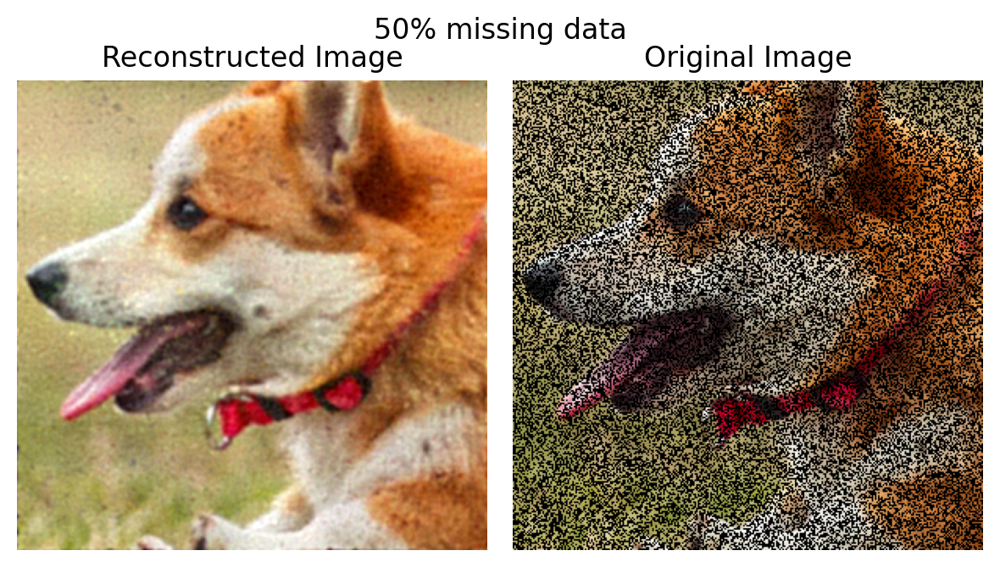

In [37]:
plot_reconstructed_and_original_image(dog_Y.reshape((300,300,3)), net, X_rff, title="50% missing data")

# 60% impurity

In [38]:
del net

x = 60
dog_Y[a[(x-10)*l//100:x*l//100]] = torch.tensor([0,0,0], dtype=dog_Y.dtype).to(device)

In [39]:
net = LinearModel(X_rff.shape[1], 3)
net.to(device)

train(net, 0.005, X_rff[a[x*l//100:]], y[a[x*l//100:]], 1500)

with torch.no_grad() :
  out = net(X_rff)

loss[5] = (np.square((y-out).cpu())).sum()/l
psnr[5] = cv2.PSNR(np.array(out.cpu()), np.array(y.cpu()))

Epoch 0 loss: 0.368922
Epoch 100 loss: 0.047445
Epoch 200 loss: 0.015281
Epoch 300 loss: 0.008979
Epoch 400 loss: 0.006312
Epoch 500 loss: 0.004720
Epoch 600 loss: 0.003670
Epoch 700 loss: 0.002948
Epoch 800 loss: 0.002439
Epoch 900 loss: 0.002069
Epoch 1000 loss: 0.001794
Epoch 1100 loss: 0.001581
Epoch 1200 loss: 0.001413
Epoch 1300 loss: 0.001277
Epoch 1400 loss: 0.001163


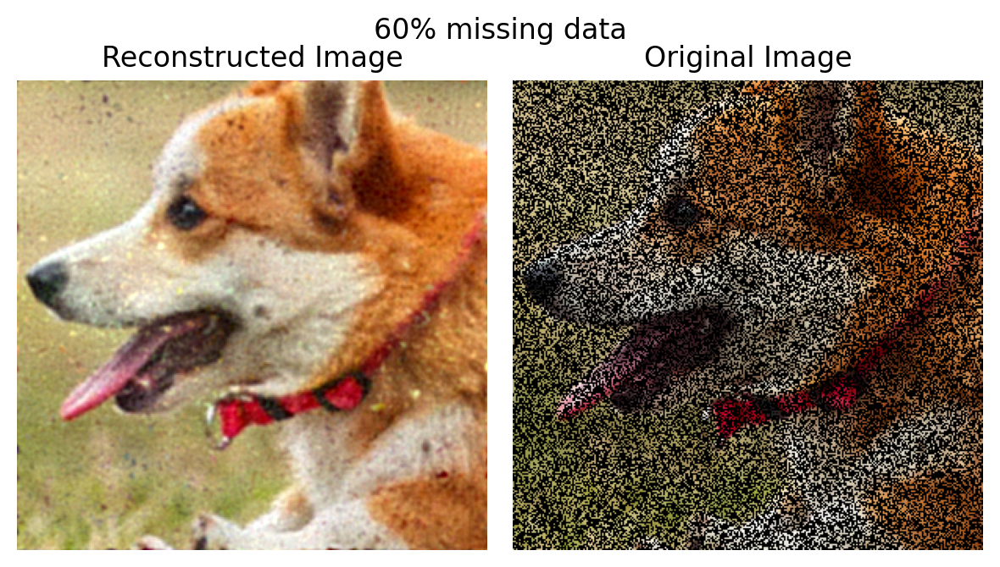

In [40]:
plot_reconstructed_and_original_image(dog_Y.reshape((300,300,3)), net, X_rff, title="60% missing data")

# 70% impurity

In [41]:
del net

x = 70
dog_Y[a[(x-10)*l//100:x*l//100]] = torch.tensor([0,0,0], dtype=dog_Y.dtype).to(device)

In [42]:
net = LinearModel(X_rff.shape[1], 3)
net.to(device)

train(net, 0.005, X_rff[a[x*l//100:]], y[a[x*l//100:]], 1500)

with torch.no_grad() :
  out = net(X_rff)

loss[6] = (np.square((y-out).cpu())).sum()/l
psnr[6] = cv2.PSNR(np.array(out.cpu()), np.array(y.cpu()))

Epoch 0 loss: 0.370133
Epoch 100 loss: 0.043291
Epoch 200 loss: 0.014318
Epoch 300 loss: 0.008226
Epoch 400 loss: 0.005662
Epoch 500 loss: 0.004202
Epoch 600 loss: 0.003261
Epoch 700 loss: 0.002617
Epoch 800 loss: 0.002159
Epoch 900 loss: 0.001825
Epoch 1000 loss: 0.001575
Epoch 1100 loss: 0.001383
Epoch 1200 loss: 0.001232
Epoch 1300 loss: 0.001110
Epoch 1400 loss: 0.001010


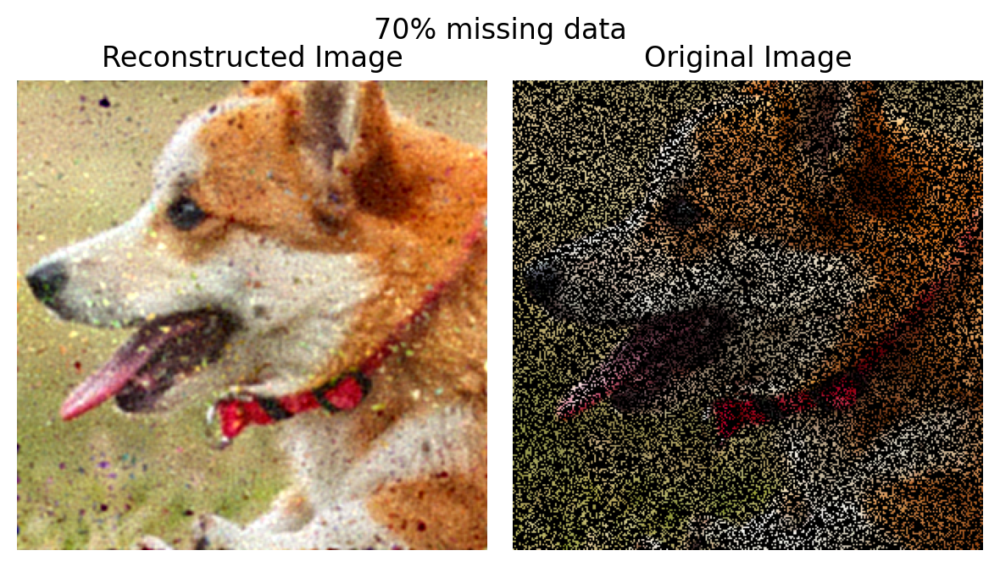

In [43]:
plot_reconstructed_and_original_image(dog_Y.reshape((300,300,3)), net, X_rff, title="70% missing data")

# 80% impurity

In [44]:
del net

x = 80
dog_Y[a[(x-10)*l//100:x*l//100]] = torch.tensor([0,0,0], dtype=dog_Y.dtype).to(device)

In [45]:
net = LinearModel(X_rff.shape[1], 3)
net.to(device)

train(net, 0.005, X_rff[a[x*l//100:]], y[a[x*l//100:]], 1500)

with torch.no_grad() :
  out = net(X_rff)

loss[7] = (np.square((y-out).cpu())).sum()/l
psnr[7] = cv2.PSNR(np.array(out.cpu()), np.array(y.cpu()))

Epoch 0 loss: 0.369790
Epoch 100 loss: 0.034064
Epoch 200 loss: 0.010843
Epoch 300 loss: 0.006024
Epoch 400 loss: 0.004040
Epoch 500 loss: 0.002965
Epoch 600 loss: 0.002297
Epoch 700 loss: 0.001846
Epoch 800 loss: 0.001525
Epoch 900 loss: 0.001285
Epoch 1000 loss: 0.001102
Epoch 1100 loss: 0.000959
Epoch 1200 loss: 0.000845
Epoch 1300 loss: 0.000753
Epoch 1400 loss: 0.000677


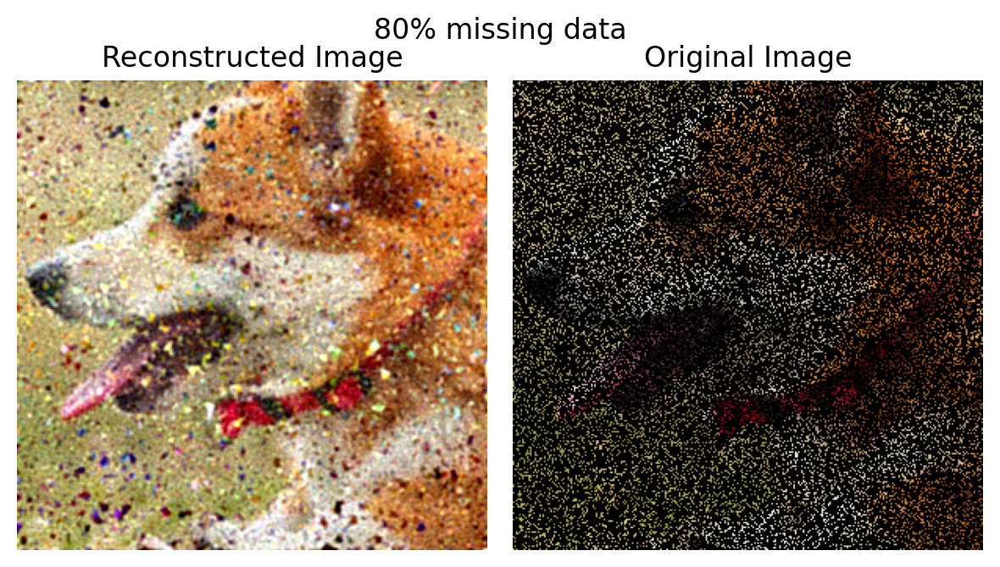

In [46]:
plot_reconstructed_and_original_image(dog_Y.reshape((300,300,3)), net, X_rff, title="80% missing data")

# 90% impurity

In [47]:
del net

x = 80
dog_Y[a[(x-10)*l//100:x*l//100]] = torch.tensor([0,0,0], dtype=dog_Y.dtype).to(device)

In [48]:
net = LinearModel(X_rff.shape[1], 3)
net.to(device)

train(net, 0.005, X_rff[a[x*l//100:]], y[a[x*l//100:]], 1500)

with torch.no_grad() :
  out = net(X_rff)

loss[8] = (np.square((dog_Y-out).cpu())).sum()/l
psnr[8] = cv2.PSNR(np.array(out.cpu()), np.array(y.cpu()))

Epoch 0 loss: 0.367587
Epoch 100 loss: 0.033537
Epoch 200 loss: 0.010717
Epoch 300 loss: 0.005975
Epoch 400 loss: 0.004015
Epoch 500 loss: 0.002950
Epoch 600 loss: 0.002288
Epoch 700 loss: 0.001840
Epoch 800 loss: 0.001520
Epoch 900 loss: 0.001282
Epoch 1000 loss: 0.001100
Epoch 1100 loss: 0.000957
Epoch 1200 loss: 0.000844
Epoch 1300 loss: 0.000752
Epoch 1400 loss: 0.000677
Epoch 1500 loss: 0.000614
Epoch 1600 loss: 0.000561
Epoch 1700 loss: 0.000516
Epoch 1800 loss: 0.000478
Epoch 1900 loss: 0.000445


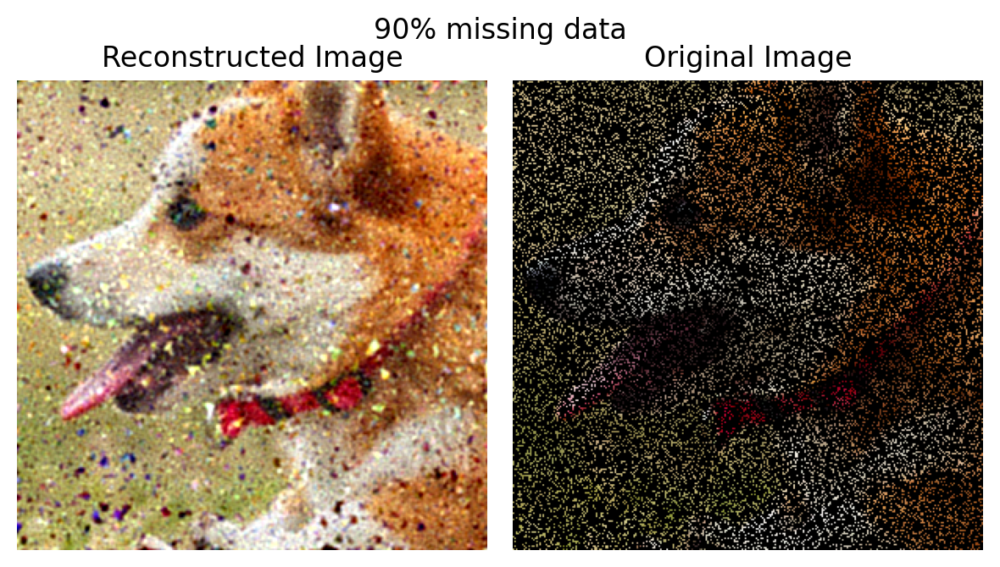

In [49]:
plot_reconstructed_and_original_image(dog_Y.reshape((300,300,3)), net, X_rff, title="90% missing data")

# Error plot

Text(0.5, 1.0, 'Error v/s % Missing data')

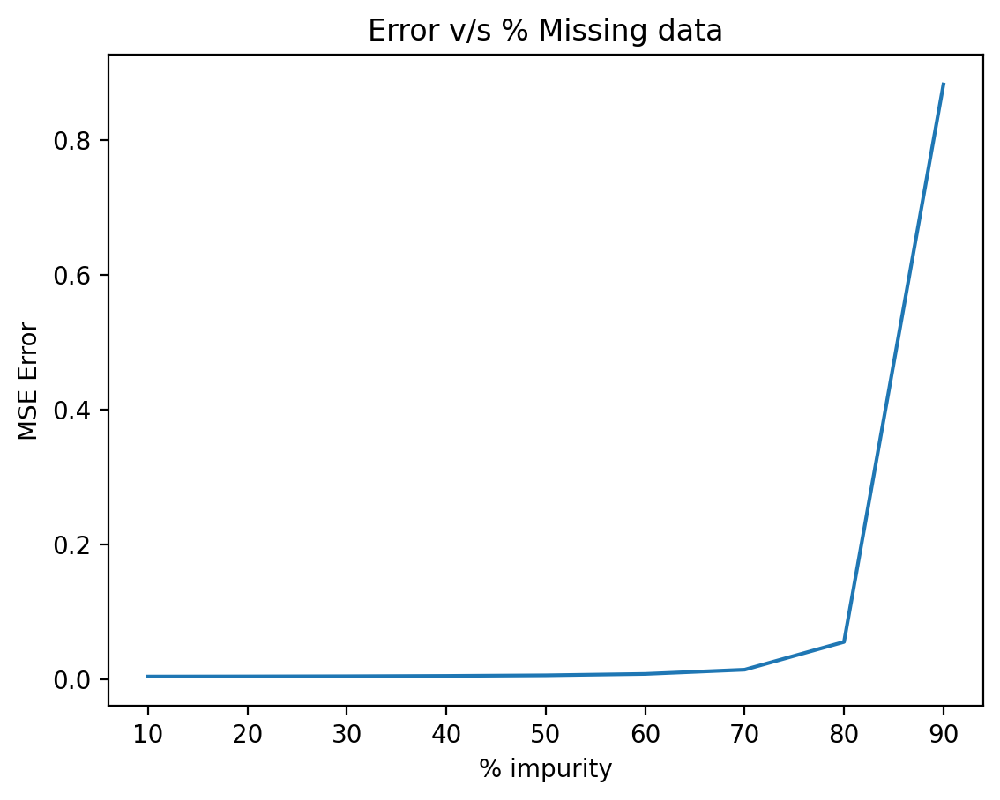

In [50]:
plt.plot(list(range(10,100,10)), loss)
plt.xlabel("% impurity")
plt.ylabel("MSE Error")
plt.title("Error v/s % Missing data")

* The error suddenly increases from 70% to 80% impurity.
* There is even more increase in the error when going from 80% to 90% impurity.
* This is clearly evident from the quality of images as well as the plot.
* In this case, if we have 30% of the image data, we can reconstruct the original image with less error, but if we have less data than 30% image reconstruction quality suddenly drops.

# Peak SNR plot

Text(0.5, 1.0, 'Peak SNR v/s % Missing data')

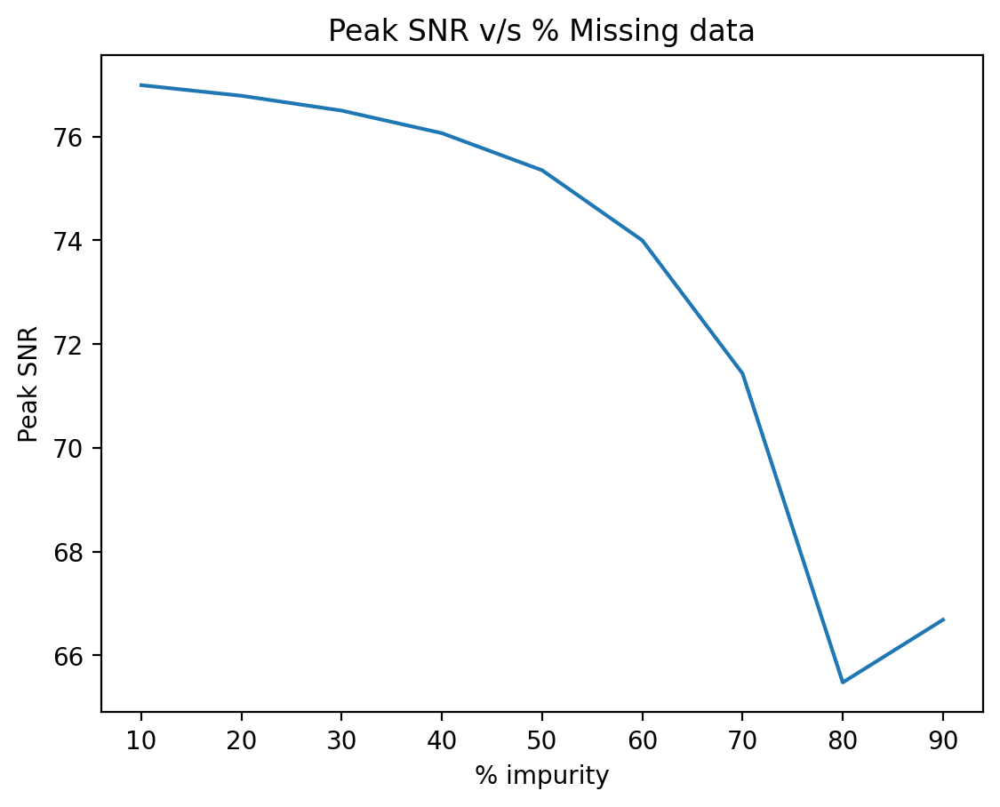

In [51]:
plt.plot(list(range(10,100,10)), psnr)
plt.xlabel("% impurity")
plt.ylabel("Peak SNR")
plt.title("Peak SNR v/s % Missing data")

* The peak SNR generally reduces with increasing impurity.
* The rise in going from 80% to 90% is outlier.
* As we increase the impurity in the image, the amount of noise in the image increase and peak SNR decrreases